# Plot different surfaces & YEO networks | colormaps

In [50]:
# Set the environment
import os
import numpy as np
import matplotlib as plt
import nibabel as nb
from nibabel.freesurfer.mghformat import load
from brainspace.plotting import plot_hemispheres
from brainspace.mesh.mesh_io import read_surface
from brainspace.datasets import load_conte69
from brainspace.datasets.base import load_mask
from brainspace.gradient import GradientMaps
from brainspace.utils.parcellation import map_to_labels
from brainspace.mesh.array_operations import smooth_array
import matplotlib.pyplot as mpl
import seaborn as sns


# Set the working directory to the 'out' directory
os.chdir("/data_/mica3/BIDS_MICs/") 

# This variable will be different for each subject
derivatives='/data_/mica3/BIDS_MICs/derivatives'
out=derivatives+ '/micapipe/'
recon='freesurfer'
sub='sub-HC062'
subjectID=sub+'_ses-01'
subjectDir=out + sub+'/ses-01'

# Here we define the atlas
atlas='schaefer-1000'

# Set paths and variables
dir_FS = derivatives+'/'+recon+'/' + subjectID
dir_FSraw = derivatives+'/'+recon+'/' + subjectID

# Load native pial surface
surf_lh = read_surface(dir_FS+'/surf/lh.pial', itype='fs')
surf_rh = read_surface(dir_FS+'/surf/rh.pial', itype='fs')

# Load native white matter surface
wm_lh = read_surface(dir_FS+'/surf/lh.white', itype='fs')
wm_rh = read_surface(dir_FS+'/surf/rh.white', itype='fs')

# Load native inflated surface
inf_lh = read_surface(dir_FS+'/surf/lh.inflated', itype='fs')
inf_rh = read_surface(dir_FS+'/surf/rh.inflated', itype='fs')

# Load conte69
c69_lh, c69_rh = load_conte69()

# Read label for conte69
micapipe='/data_/mica1/01_programs/micapipe-v0.2.0'
labels_c69 = np.loadtxt(open(micapipe + '/parcellations/' + atlas + '_conte69.csv'), dtype=int)

# mask of the medial wall
mask_c69 = load_mask(join=True)

# Load fsaverage5
fs5_lh = read_surface('/data_/mica3/BIDS_PNI/derivatives_dev/fastsurfer/fsaverage5/surf/lh.pial', itype='fs')
fs5_rh = read_surface('/data_/mica3/BIDS_PNI/derivatives_dev/fastsurfer/fsaverage5/surf/rh.pial', itype='fs')

# Load annotation file in fsaverage5
annot_lh_fs5= nb.freesurfer.read_annot(micapipe + '/parcellations/lh.'+atlas+'_mics.annot')
Ndim = max(np.unique(annot_lh_fs5[0]))
annot_rh_fs5= nb.freesurfer.read_annot(micapipe + '/parcellations/rh.'+atlas+'_mics.annot')[0]+Ndim

# Load the inflated surface
surf_inflated_dir = '/host/percy/local_raid/ke/toolbox/micasoft/parcellations/fs_LR-conte69/ColeAnticevic/'

# Load native mid surface
inf_lh = read_surface(surf_inflated_dir+'S1200.L.inflated_MSMAll.32k_fs_LR.surf.gii', itype='gii')
inf_rh = read_surface(surf_inflated_dir+'S1200.R.inflated_MSMAll.32k_fs_LR.surf.gii', itype='gii')

# Canonical surface
c5_lh = read_surface('/data_/mica3/BIDS_MICs/fsLR_5k/surface/fsLR_5k-regular.L.surf.gii', itype='gii')
c5_rh = read_surface('/data_/mica3/BIDS_MICs/fsLR_5k/surface/fsLR_5k-regular.R.surf.gii', itype='gii')

# Colormap
ColCurv= plt.colors.ListedColormap(['#A2CD5A', '#A0CA5B', '#9FC85C', '#9EC55D', '#9DC35E', '#9CC05F', '#9BBE61', '#9ABB62', '#99B963', '#98B664', '#96B465', '#95B166', '#94AF68', '#93AC69', '#92AA6A', '#91A76B', '#90A56C', '#8FA26D', '#8EA06F', '#8C9D70', '#8B9B71', '#8A9972', '#899673', '#889475', '#879176', '#868F77', '#858C78', '#848A79', '#82877A', '#81857C', '#80827D', '#7F807E', '#807D7D', '#827A7A', '#857777', '#877575', '#8A7272', '#8C6F6F', '#8F6C6C', '#916969', '#946666', '#966464', '#996161', '#9B5E5E', '#9D5B5B', '#A05858', '#A25656', '#A55353', '#A75050', '#AA4D4D', '#AC4A4A', '#AF4747', '#B14545', '#B44242', '#B63F3F', '#B93C3C', '#BB3939', '#BE3636', '#C03434', '#C33131', '#C52E2E', '#C82B2B', '#CA2828', '#CD2626'])
grey = plt.colors.ListedColormap(np.full((256, 4), [0.65, 0.65, 0.65, 1]))

In [9]:
def smooth_surf(surf_l, surf_r, points, Kernel='uniform', Niter=20, Relax=0.5, Mask=mask_c69):
    '''
    This function smooth an array (left and right) on a given surface
    Parameters
    ----------
    surf_l : np.array left surface 
    surf_r : np.array right surface
    points : np.array surface data
    Kernel : {'uniform', 'gaussian', 'inverse_distance'}
    Niter  : int, optional NUmber of smooth iterations
    Relax  : relax : float, optional relaxation facto
    Mask   : str or 1D ndarray, optional
    Returns
    -------
    sdata : smoothed numpy array
    
    '''
    n2dim = int(Mask.shape[0]/2)
    Mask_l=mask_c69[0:n2dim]
    Mask_r=mask_c69[n2dim:Mask.shape[0]]
    sdata = np.concatenate((smooth_array(surf_l, points[0:32492],kernel=Kernel, n_iter=Niter,relax=Relax, mask=Mask_l), 
                          smooth_array(surf_r, points[32492:64984],kernel=Kernel, n_iter=Niter,relax=Relax, mask=Mask_r)), axis=0)
    return(sdata)

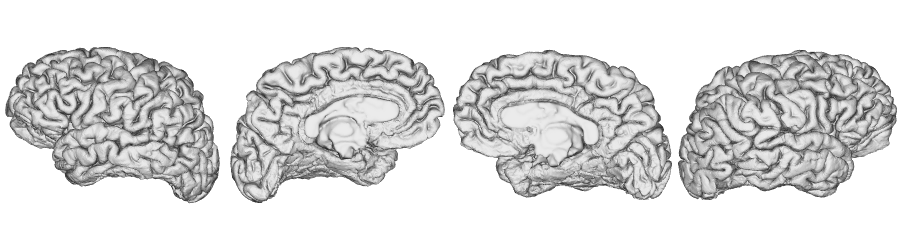

In [10]:
# Plot the surface
plot_hemispheres(surf_lh, surf_rh, size=(900, 250), zoom=1.25, embed_nb=True, interactive=False, share='both',
                 nan_color=(0, 0, 0, 1), color_range=(1.5, 4), cmap=grey, transparent_bg=False,
                screenshot=False, filename='/home/bic/rcruces/Desktop/surf_native.png')

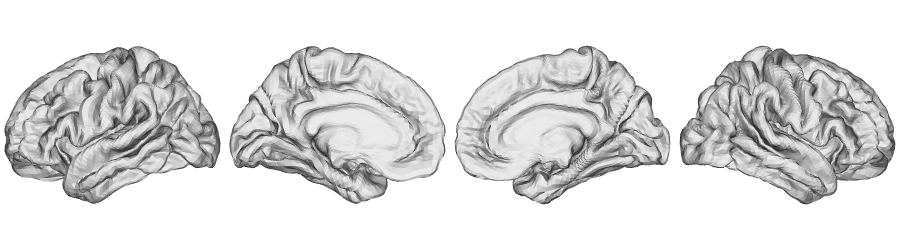

In [11]:
# Plot the surface
plot_hemispheres(fs5_lh, fs5_rh, size=(900, 250), zoom=1.25, embed_nb=True, interactive=False, share='both',
                 nan_color=(0, 0, 0, 1), color_range=(1.5, 4), cmap=grey, transparent_bg=False,
                screenshot=False, filename='/home/bic/rcruces/Desktop/surf_fsaverage5.png')

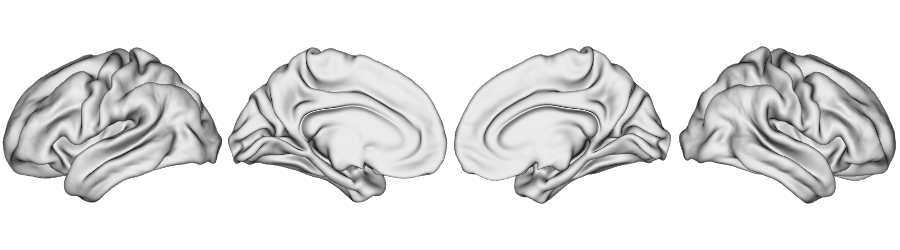

In [12]:
# Plot the surface
plot_hemispheres(c69_lh, c69_rh, size=(900, 250), zoom=1.25, embed_nb=True, interactive=False, share='both',
                 nan_color=(0, 0, 0, 1), color_range=(1.5, 4), cmap=grey, transparent_bg=False,
                screenshot=False, filename='/home/bic/rcruces/Desktop/surf_c69.png')

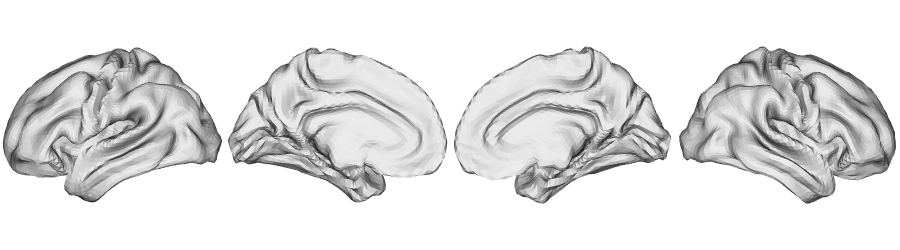

In [13]:
# Plot the surface
plot_hemispheres(c5_lh, c5_rh, size=(900, 250), zoom=1.25, embed_nb=True, interactive=False, share='both',
                 nan_color=(0, 0, 0, 1), color_range=(1.5, 4), cmap=grey, transparent_bg=False,
                screenshot=False, filename='/home/bic/rcruces/Desktop/surf_fsLR5k.png')

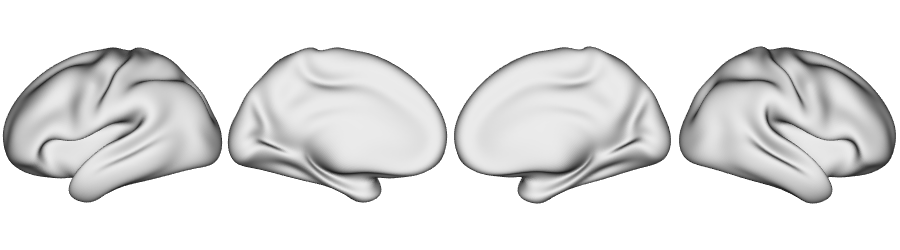

In [14]:
# Plot the surface
plot_hemispheres(inf_lh, inf_rh, size=(900, 250), zoom=1.25, embed_nb=True, interactive=False, share='both',
                 nan_color=(0, 0, 0, 1), color_range=(1.5, 4), cmap=grey, transparent_bg=False,
                screenshot=False, filename='/home/bic/rcruces/Desktop/surf_c69-inflated.png')

# YEO networks

In [18]:
# Load the cortical connectome
funcAcq='desc-se_task-rest_acq-AP_bold'
mtx_fs = np.loadtxt(subjectDir + '/func/' + funcAcq + '/surfaces/' + subjectID + '_func_space-fsnative_atlas-' + atlas + '_desc-FC.txt', 
                    dtype=float, delimiter=' ')

# slice the matrix
FC = mtx_fs[49:, 49:]
FC = np.delete(np.delete(FC, 200, axis=0), 200, axis=1)

# Fischer transformation
FCz = np.arctanh(FC)

# replace inf with 0
FCz[~np.isfinite(FCz)] = 0

# Mirror the matrix
FCz = np.triu(FCz,1)+FCz.T

# Load annotations
lh_lab = nb.freesurfer.io.read_annot(micapipe + '/parcellations/lh.' + atlas + '_mics.annot')
rh_lab = nb.freesurfer.io.read_annot(micapipe + '/parcellations/rh.' + atlas + '_mics.annot')
labs = lh_lab[2][1:] + rh_lab[2][1:]

/host/yeatman/local_raid/temporaryLocalProcessing/ipykernel_40308/2165664089.py:11: RuntimeWarning: divide by zero encountered in arctanh
  FCz = np.arctanh(FC)


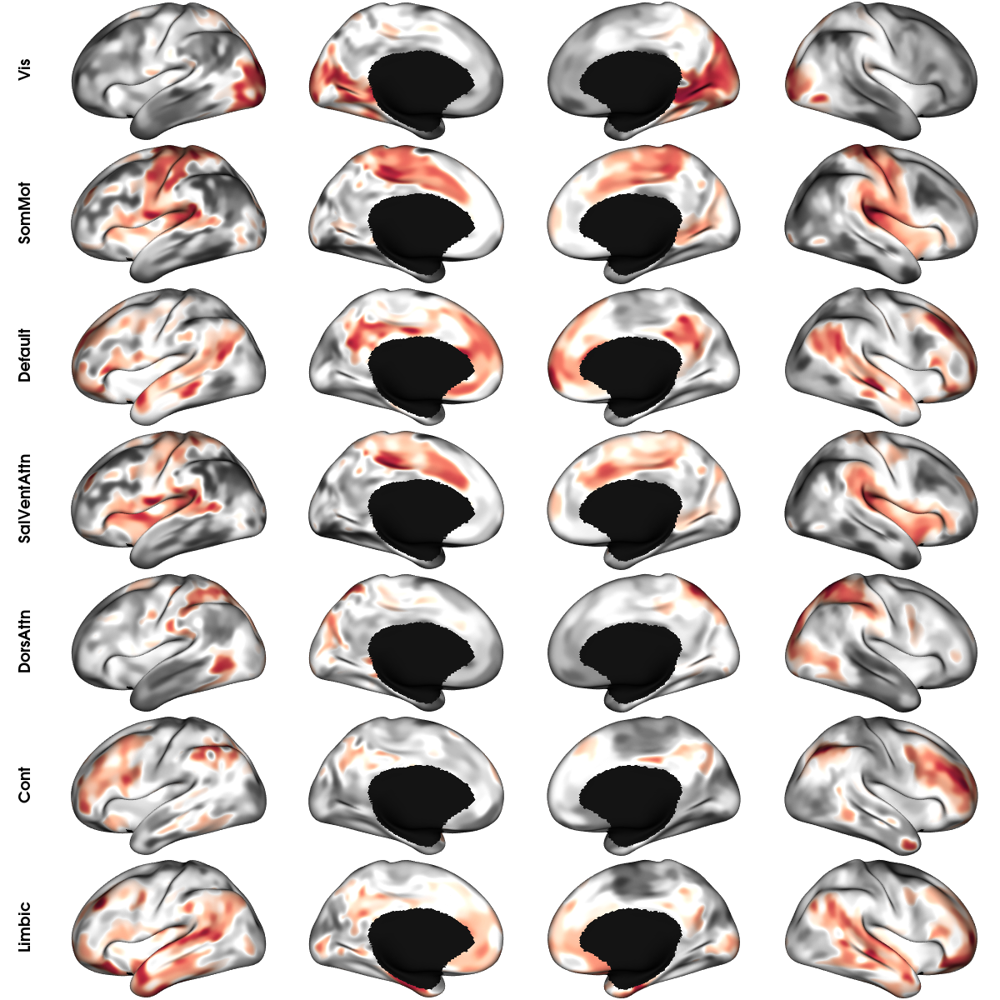

In [19]:
# Load annotations
lh_lab = nb.freesurfer.io.read_annot(micapipe + '/parcellations/lh.' + atlas + '_mics.annot')
rh_lab = nb.freesurfer.io.read_annot(micapipe + '/parcellations/rh.' + atlas + '_mics.annot')
labs = lh_lab[2][1:] + rh_lab[2][1:]

# Plot each YEO network
netStrs = ['Vis', 'SomMot', 'Default', 'SalVentAttn', 'DorsAttn', 'Cont', 'Limbic' ]
networks = [None] * len(netStrs)

# Positive correlations
fc_pos = np.copy(FCz)
fc_pos[(0>fc_pos)] = 0

for i, netNom in enumerate(netStrs):
    #print(str(i) + ' ' + netNom)
    indx = [netNom in str(x) for x in labs]
    net = np.sum(fc_pos[indx,:], axis=0)
    networks[i] = map_to_labels(net, labels_c69, fill=np.nan, mask=mask_c69)
    networks[i] = smooth_surf(inf_lh, inf_rh,networks[i], Niter=10)
    del(net)

# YEO networks
plot_hemispheres(inf_lh, inf_rh, array_name=networks, size=(1200, 1200), cmap='RdGy_r',
                 embed_nb=True,  label_text={'left':netStrs}, color_bar=False,
                 zoom=1.75, nan_color=(0, 0, 0, 1), interactive=False, background=(0,0,0),
                screenshot=False, filename='/home/bic/rcruces/Desktop/FC_yeo-sumpos.png')


# Colormaps !!! 
Check this out https://pratiman-91.github.io/colormaps/

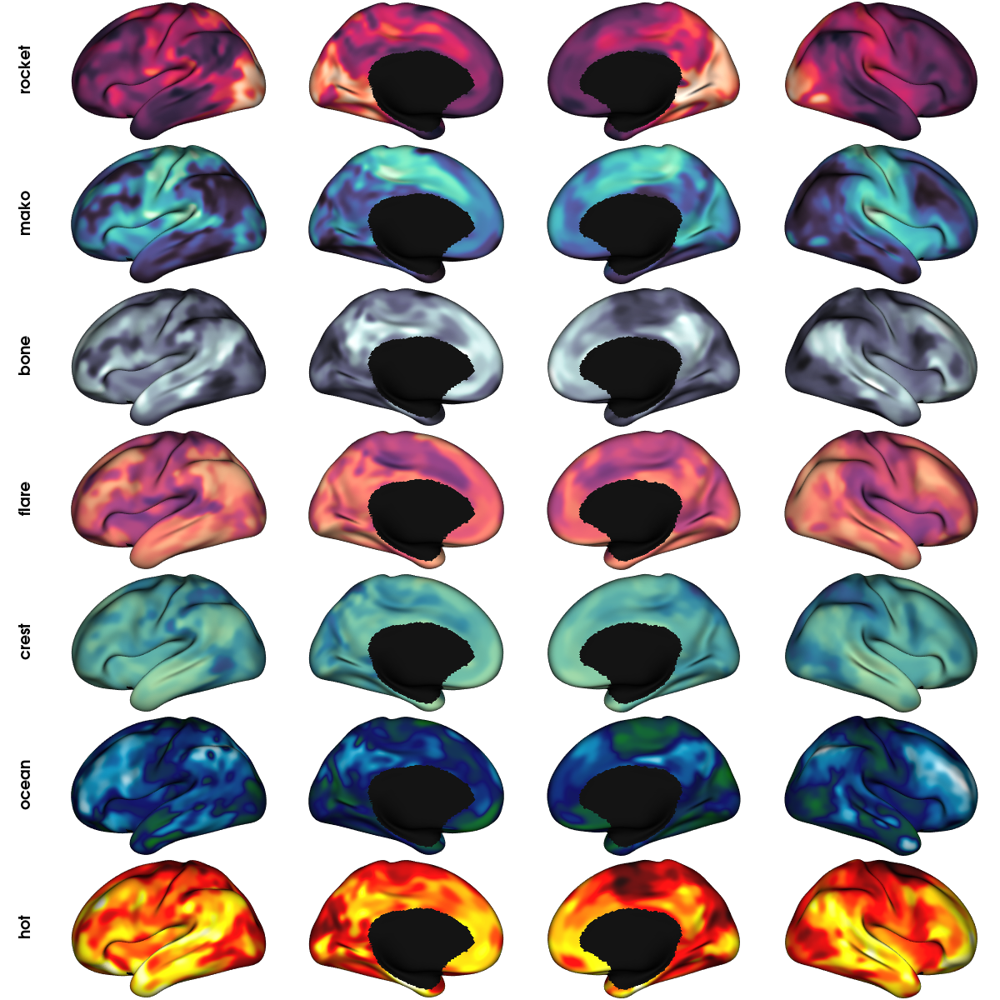

In [58]:
# colormaps as list for brainspace array
cmp1 = ['rocket', 'mako', 'bone', 'flare', 'crest', 'ocean', 'hot']
plot_hemispheres(inf_lh, inf_rh, array_name=networks, size=(1200, 1200), cmap=cmp1,
                 embed_nb=True, label_text={'left':cmp1}, color_bar=False,
                 zoom=1.75, nan_color=(0, 0, 0, 1), interactive=False, background=(0,0,0),
                screenshot=False)

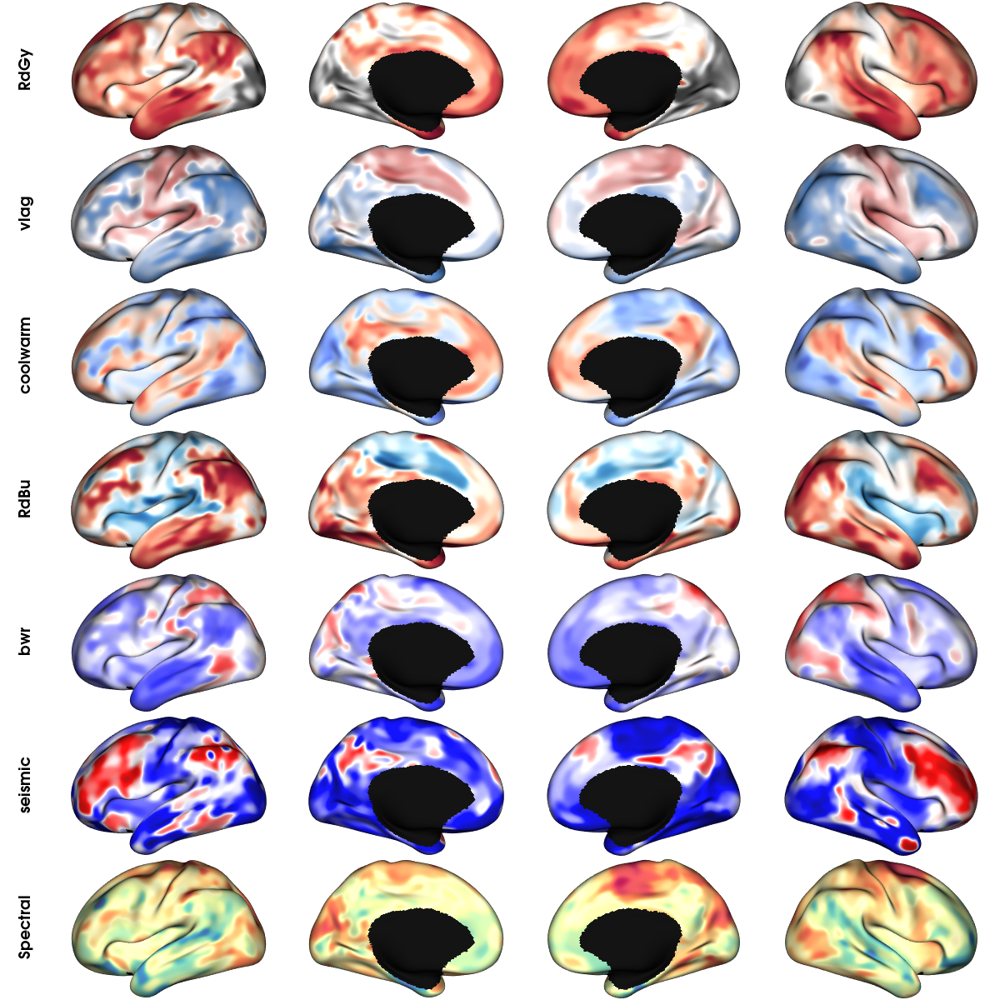

In [53]:
cmp3 = ['RdGy','vlag','coolwarm', 'RdBu', 'bwr','seismic','Spectral']
plot_hemispheres(inf_lh, inf_rh, array_name=networks, size=(1200, 1200), cmap=cmp3,
                 embed_nb=True, label_text={'left':cmp3}, color_bar=False,
                 zoom=1.75, nan_color=(0, 0, 0, 1), interactive=False, background=(0,0,0),
                screenshot=False)

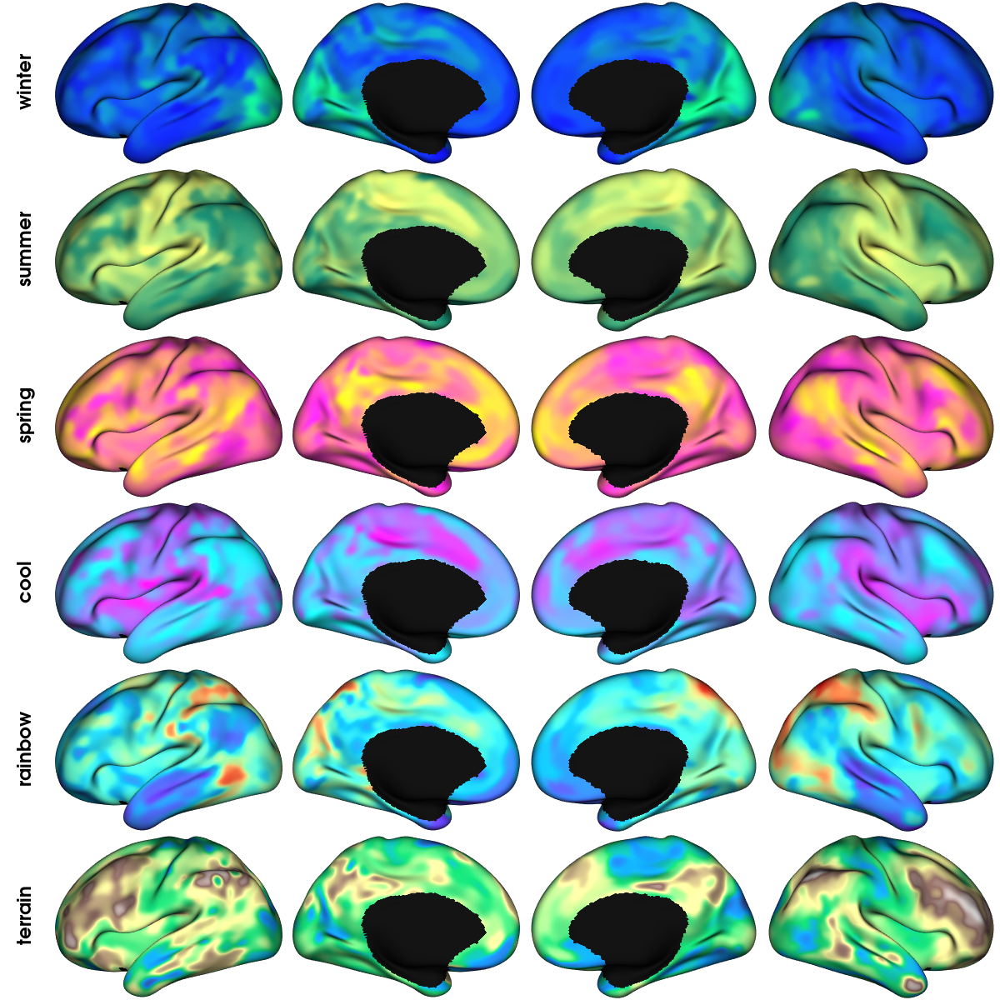

In [56]:
cmp4 = ['winter', 'summer', 'spring', 'cool', 'rainbow','terrain']
plot_hemispheres(inf_lh, inf_rh, array_name=networks[0:6], size=(1200, 1200), cmap=cmp4,
                 embed_nb=True, label_text={'left':cmp4}, color_bar=False,
                 zoom=1.75, nan_color=(0, 0, 0, 1), interactive=False, background=(0,0,0),
                screenshot=False)

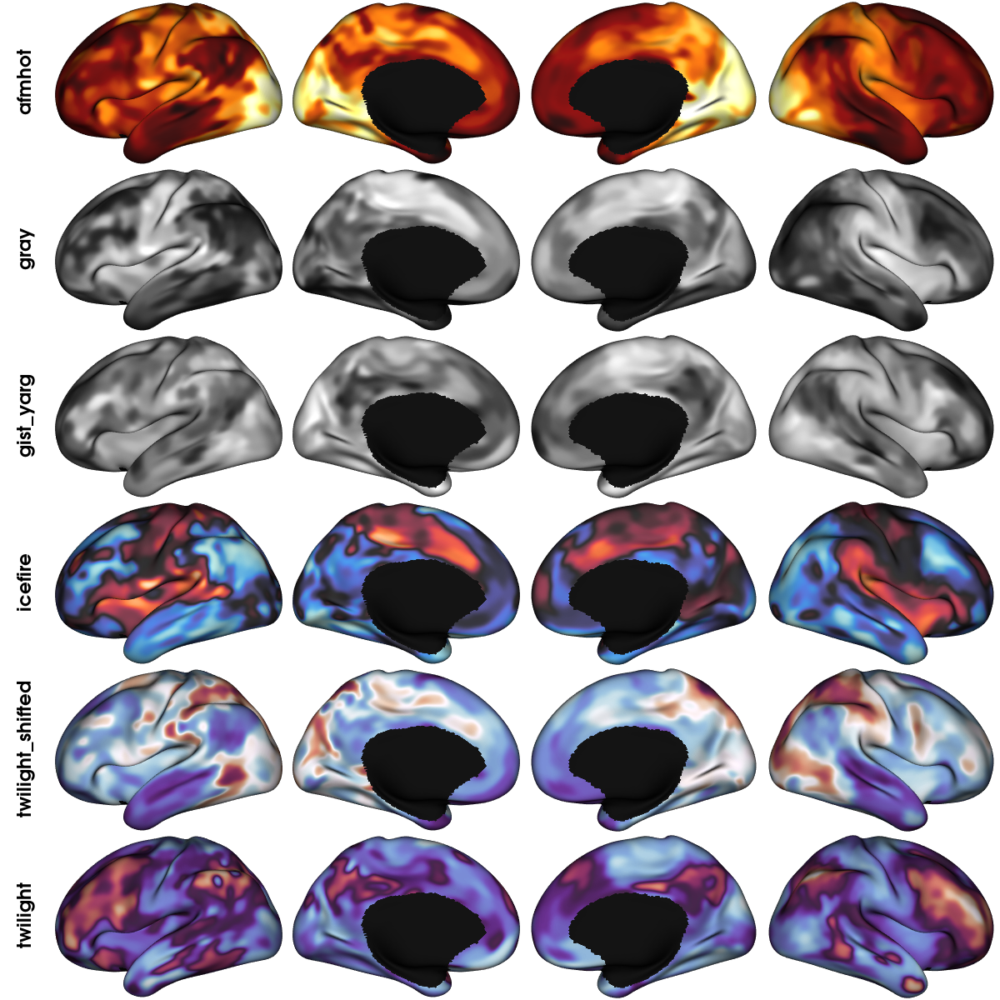

In [57]:
cmp2 = ['afmhot', 'gray','gist_yarg','icefire', 'twilight_shifted', 'twilight']
plot_hemispheres(inf_lh, inf_rh, array_name=networks[0:6], size=(1200, 1200), cmap=cmp2,
                 embed_nb=True, label_text={'left':cmp2}, color_bar=False,
                 zoom=1.75, nan_color=(0, 0, 0, 1), interactive=False, background=(0,0,0),
                screenshot=False)

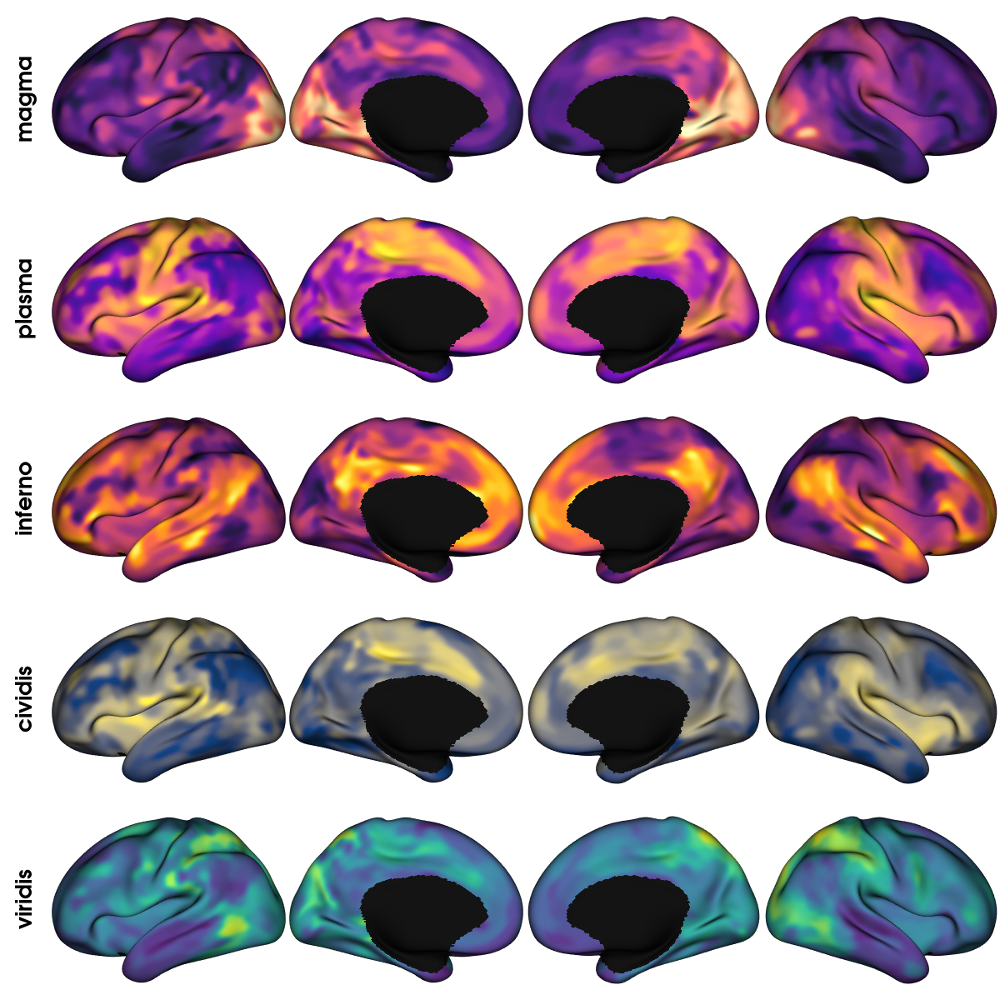

In [64]:
cmp5 = ['magma', 'plasma', 'inferno', 'cividis', 'viridis']
cmp6 = ['cubehelix' 'tab20c' 'tab20b' 'tab20' 'tab10']
plot_hemispheres(inf_lh, inf_rh, array_name=networks[0:5], size=(1200, 1200), cmap=cmp5,
                 embed_nb=True, label_text={'left':cmp5}, color_bar=False,
                 zoom=1.5, nan_color=(0, 0, 0, 1), interactive=False, background=(0,0,0),
                screenshot=False)

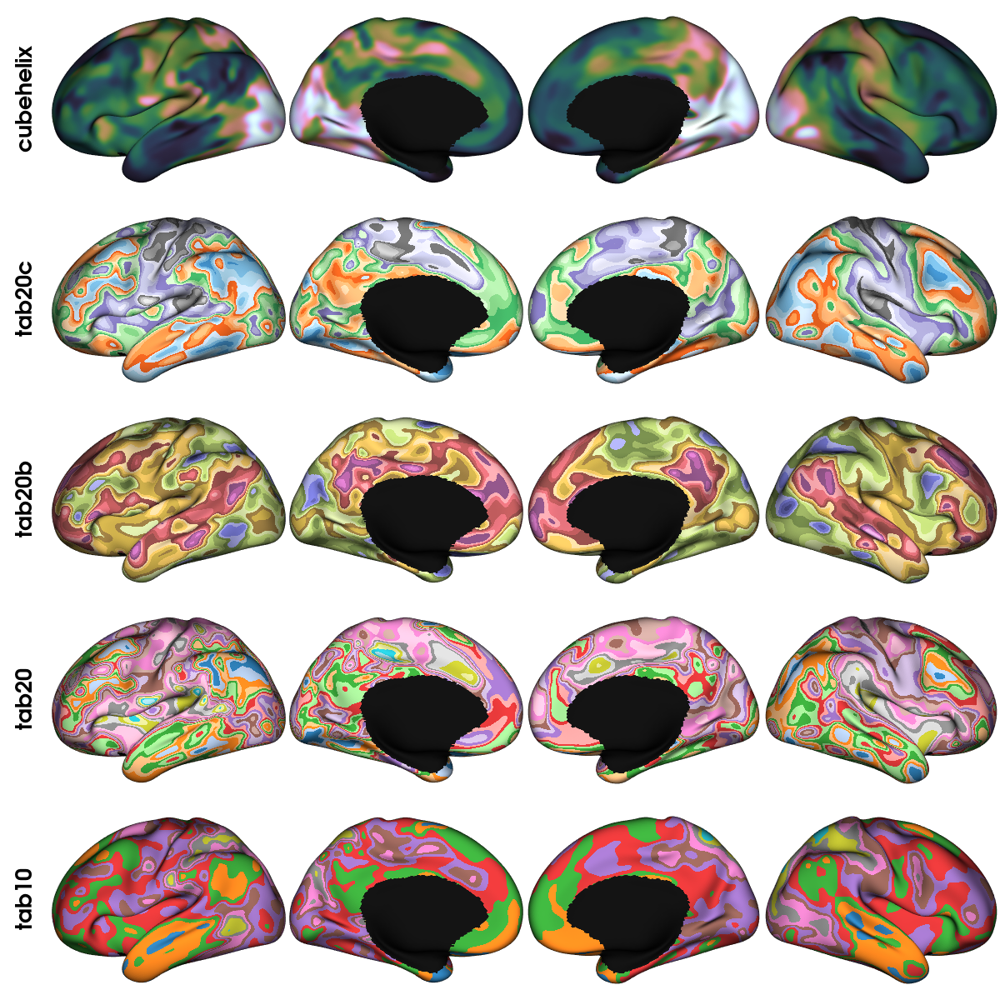

In [66]:
cmp6 = ['cubehelix', 'tab20c', 'tab20b', 'tab20', 'tab10']
plot_hemispheres(inf_lh, inf_rh, array_name=networks[0:5], size=(1200, 1200), cmap=cmp6,
                 embed_nb=True, label_text={'left':cmp6}, color_bar=False,
                 zoom=1.5, nan_color=(0, 0, 0, 1), interactive=False, background=(0,0,0),
                screenshot=False)